# Audio Processing & Algorithmic Reverb #

UCLA Physics 180D Acoustics Lab Final Project

Oliver van Moon

2021 Spring


The goal of this project is to use Python to manipulate and process audio, specifically with the goal of attempting to simulate or mimic reverberation (reverb) in an acoustic space. I have now learned that algorithmic reverb is notoriously difficult and complex. The goal here is not to create the most accurate or beautiful sounding reverb, but to teach myself some basics of digital signal processing on the sample level and to become comfortable implementing filters and complex signal chains in a digital environment. (In the future, I am interested in developing plugins for digital audio workstations for music production purposes, which will require knowledge of other languages and platforms, but the mathematics and algorithms are essentially the same in any language, so this seems like a good place to start.)

This Jupyter Notebook will be a kind of guided tour of some of what I have learned during Spring 2021 as I've read, researched, coded, deleted, rewritten, debugged, etc. (If you're reading this, it's probably looking pretty clean now, but of course it wasn't always this way!)

First up, it's time to import some modules.

In [1]:
# to do math
import numpy as np      

# for importing/exporting audio
from scipy.io import wavfile

# for plotting
from matplotlib import pyplot as plt  

# for copying objects
import copy

# for displaying an audio player within the notebook
from IPython.display import display 
from IPython.display import Audio as displayaudio

Now I'll define some functions which are helpful throughout this project, and I'll set defaults for plotting.

In [2]:
# convert time in milliseconds to number of samples at the sample rate
def mstosamples(ms, srate):
    return int(ms / 1000 * srate)

# add two arrays of samples (which can have different lenths) starting at their beginnings
def add(samples1, samples2):
    l1 = len(samples1)
    l2 = len(samples2)
    if l1 > l2:
        samplesout = samples1.copy()
        samplesout[:l2] += samples2
    else:
        samplesout = samples2.copy()
        samplesout[:l1] += samples1
    return samplesout

# custom plot of multiple arrays in a vertical stack with same ticks on vertical axis
# in order to see differences in amplitudes
def multiplot(thelist):
    l = len(thelist)
    fix,axs = plt.subplots(l, sharey=True)
    for index,thing in enumerate(thelist):
        axs[index].plot(thing)

In [3]:
# set plotting defaults
plt.rcParams.update({'figure.autolayout': True})
plt.rcParams['figure.figsize'] = [12, 6]

The following Audio class defines an object which holds the samples of an audio signal in a NumPy array along with the sample rate.

Defining my own class also allows me to redefine indexing of the array in a useful way for implementing filters. For example, if $y[n]$ is the signal $x[n]$ delayed by $d$ samples, then $y[n] = x[n-d]$. Let $d = 3$. Say I want to calculate $y[2]$. The sample $y[2] = x[2-3] = x[-1]$. If my signal $x[n]$ starts at index $n = 0$, there is a problem. The samples are stored in a numpy array, which interprets `x[-1]` as the last element of the array `x`, which is not what I want. (I can also run into problems with the index being beyond the end of an array.) Instead, I have defined indexing (with the `__getitem__` and `__setitem__` methods) so that any index outside of the range $[0, l)$ returns `0` where $l$ is the length of the array. This is appropriate for processing audio since we can assume that the absence of a signal is silence, i.e., zero amplitude.

I can also define addition (mixing), boosting/attenuating/inverting, and other operations on audio signals in a tidy way.

In [4]:
class Audio:

    # initialize audio object
    def __init__(self, samples=[], srate=48000):
        self.srate = srate
        self.samples = np.array(samples)
        self.dt = self.samples.dtype

    # import audio data from .wav file   
    def read(self, filename):
        self.srate, self.samples = wavfile.read(filename)
        self.dt = self.samples.dtype
    
    # write audio data to .wav file
    def write(self, filename):
        wavfile.write(filename, self.srate, self.samples)
        
    # display audio in notebook for listening
    def display(self):
        scaled = self.samples / np.iinfo(self.dt).max
        display(displayaudio(scaled, rate=self.srate, normalize=False))
        # to properly hear the differences between different audio processing,
        # I need the audio to play at the correct relative volumes, so
        # I set the normalize parameter to False.
        # displayaudio() function requires values between -1 and 1 (when
        # not normalizing), but the signal is generally stored differently,
        # so the signal is scaled to fit the requirement.
        # display() function on outside needed to get player to
        # actually show up in notebook when method runs.
        # displayaudio() is iPython.display.Audio renamed on import
        
    # plot waveform
    def plot(self):
        plt.plot(self.samples)

    # get sample at index and return 0 if out of range
    # this allows me to to use [] to index samples from the object
    def __getitem__(self, index):
        if 0 <= index < len(self.samples):
            return self.samples[index]
        else:
            return np.dtype(self.dt).type(0) # zero in same type as rest of samples
    
    # set sample at index only if in range
    # allows use of [] to set values
    def __setitem__(self, index, value):
        if 0 <= index < len(self.samples):
            self.samples[index] = value
        else:
            pass

    # add (mix) audio signals
    # this allows me to use the + sign operator
    def __add__(self, other):
        mix = add(self.samples, other.samples)
        return Audio(mix, self.srate)

    # scale/gain/multiply
    # this allows me to use the * sign operator
    def __mul__(self, gain):
        result = self.samples * gain
        return Audio(result, self.srate)

    # change array dtype (this is sometimes needed explicitly when
    # doing some math would cause upcasting which can break stuff)
    def astype(self, targettype):
        return Audio(self.samples.astype(targettype), self.srate)

    # print info about audio data
    def printinfo(self):
            l = len(self.samples)
            T = l/self.srate
            try:
                nmax = np.argmax(abs(self.samples))
                maxval = np.max(abs(self.samples))

                print('sample rate (Hz):', self.srate)
                print('samples:', l)
                print('time (s):', T)
                print()
                print(np.iinfo(self.dt))
                print('sample with largest amplitude:', nmax)
                print('time of largest amplitude (s):', nmax/self.srate)
                print('largest amplitude:', maxval)
            except:
                print('error calclating info')

Now I'll use my custom class to create an Audio object, import data from a .wav file, display an audio player, plot the waveform, and print some information about the audio and data type of the sample array.

sample rate (Hz): 48000
samples: 176128
time (s): 3.6693333333333333

Machine parameters for int16
---------------------------------------------------------------
min = -32768
max = 32767
---------------------------------------------------------------

sample with largest amplitude: 50685
time of largest amplitude (s): 1.0559375
largest amplitude: 10480


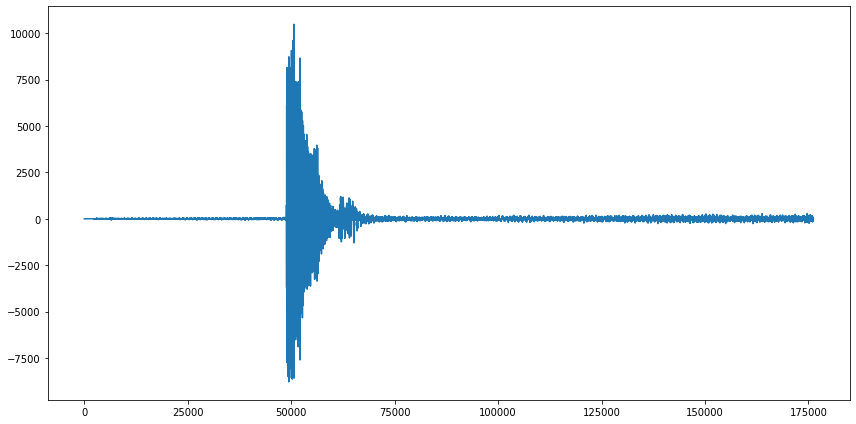

In [5]:
input = Audio()
input.read('input_audio.wav')
input.display()
input.plot()
input.printinfo()

I have implemented some basic filters which can process audio.

Some terminology: Feedforward means the input signal is fed to the output to be added to the signal sent through the main filter. Feedback means the output of the entire filter is routed back and added to the input. Feedback is especially useful for simulating echoes and reverb because it creates a repeating signal. If the feedback is attenuated i.e., $|g|<1$, it creates decaying echoes.

In [6]:
# feedforward comb filter
# d = delay in samples
# g = gain parameter
def combforward(input, d, g):
    filter = copy.deepcopy(input)
    for n in range(len(filter.samples)):
        filter[n] = input[n] + g * input[n-d]  
    return filter

# feedback comb filter
# d = delay in samples
# g = gain parameter
def combback(input, d, g):
    filter = copy.deepcopy(input)
    for n in range(len(filter.samples)):
        filter[n] = input[n] + g * filter[n-d]  
    return filter

# allpass filter
# d = delay in samples
# g = gain parameter
def allpass(input, d, g):
    filter = copy.deepcopy(input)
    for n in range(len(filter.samples)):
        filter[n] = -g * input[n] + input[n-d] + g * filter[n-d]
    return filter

# RC lowpass filter
# fc = cutoff frequency (Hz)
def lowpass(input, fc):
    filter = copy.deepcopy(input)
    tsample = 1/input.srate
    alpha = (2*np.pi*tsample*fc)/(2*np.pi*tsample*fc+1)
    for n in range(len(filter.samples)):
        filter[n] = alpha * input[n] + (1-alpha) * filter[n-1]
    return filter

# RC highpass filter
# fc = cutoff frequency (Hz)
def highpass(input, fc):
    filter = copy.deepcopy(input)
    tsample = 1/input.srate
    alpha = 1/(2*np.pi*tsample*fc+1)
    for n in range(len(filter.samples)):
        filter[n] = alpha * (input[n] - input[n-1]) + alpha * filter[n-1]
    return filter

Let's hear these filters with a few different options for their parameters. 

In [7]:
d1 = mstosamples(2.1, input.srate)
d2 = mstosamples(50, input.srate)
d3 = mstosamples(600, input.srate)

cf1 = combforward(input, d1, 0.9)
cf2 = combforward(input, d2, 0.9)
cf3 = combforward(input, d3, 0.4)

cf1.display()
cf2.display()
cf3.display()

Due to the feedforward component of the filter, we are hearing the original sound combined with the delayed sound. At short delay times, the signals overlap, creating constructive and destructive interference patterns which "color" the sound. This is how several electronic audio effects work like choruses, phasers and flangers. At longer delay times, the transients separate and we perceive an echo.

Below I have plotted the waveforms of the examples above.

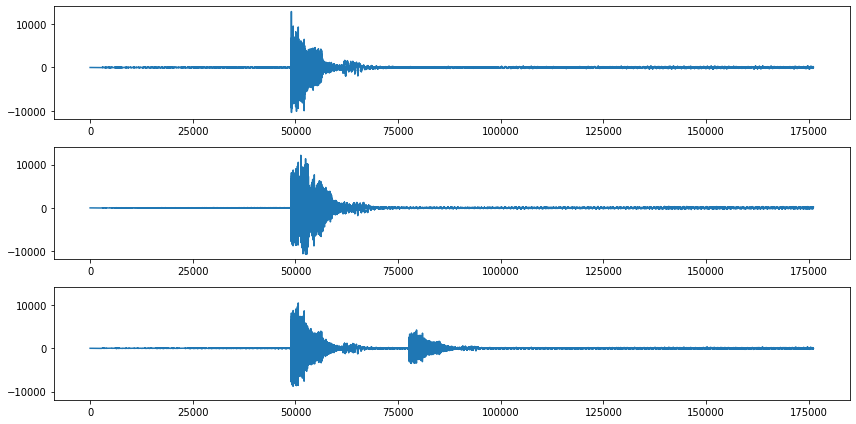

In [8]:
multiplot([cf1.samples, cf2.samples, cf3.samples])

Here's the comb filter with feedback. It is important to keep $|g|<1$ or the filter is unstable and will continuously amplify any noise until the signal overloads.

In [9]:
d1 = mstosamples(2.1, input.srate)
d2 = mstosamples(50, input.srate)
d3 = mstosamples(600, input.srate)

cb1 = combback(input, d1, 0.9)
cb2 = combback(input, d2, 0.9)
cb3 = combback(input, d3, 0.4)

cb1.display()
cb2.display()
cb3.display()

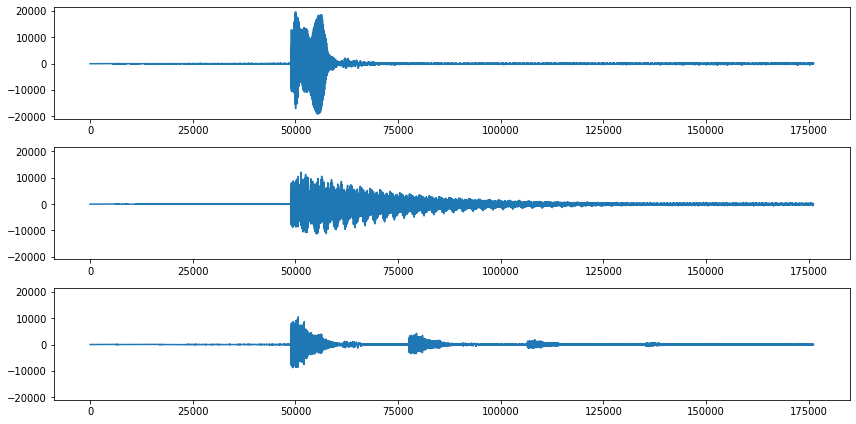

In [10]:
multiplot([cb1.samples,cb2.samples,cb3.samples])

The allpass filter creates delay with feedback while preserving the relative amplitude of different frequency components. This filter is a bit more complex than the comb filters and has feedforward and feedback.

In [11]:
d1 = mstosamples(2.1, input.srate)
d2 = mstosamples(50, input.srate)
d3 = mstosamples(600, input.srate)

ap1 = allpass(input, d1, 0.8)
ap2 = allpass(input, d2, 0.8)
ap3 = allpass(input, d3, 0.5)

ap1.display()
ap2.display()
ap3.display()

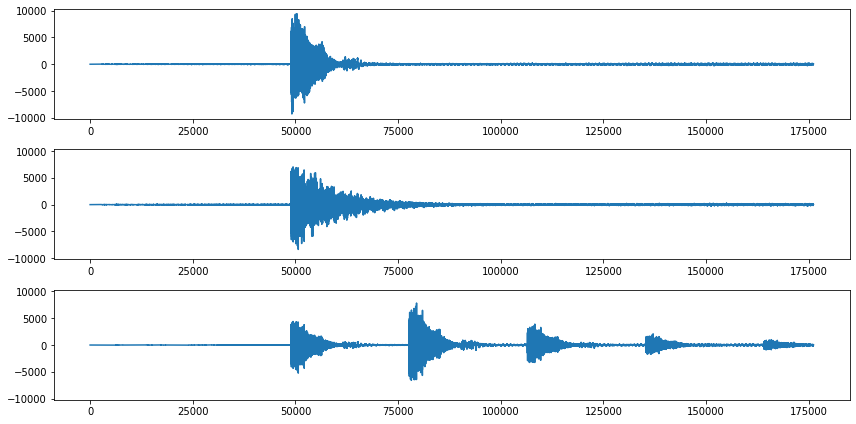

In [12]:
multiplot([ap1.samples, ap2.samples, ap3.samples])

The lowpass filter attenuates frequencies above the cutoff frequency, passing low frequency signal. In musical terms, this cuts out treble.

In [13]:
lp1 = lowpass(input, 100)
lp2 = lowpass(input, 700)
lp3 = lowpass(input, 1500)

lp1.display()
lp2.display()
lp3.display()

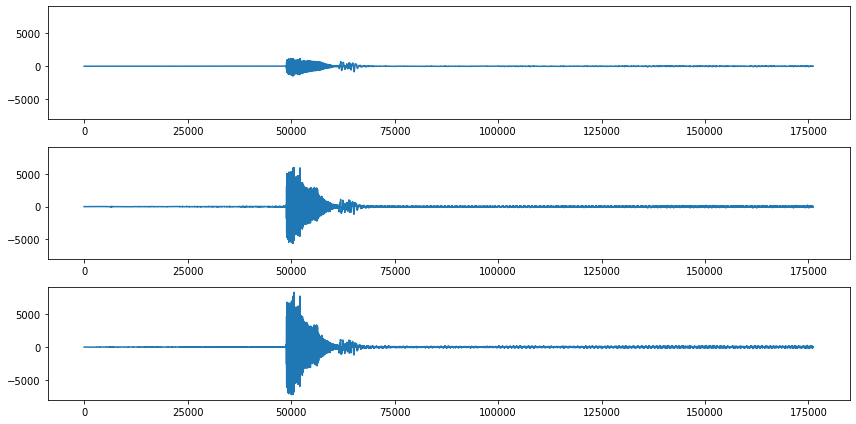

In [14]:
multiplot([lp1.samples, lp2.samples, lp3.samples])

The highpass filter attenuates frequencies below the cutoff frequency, passing high frequency signal. In musical terms, this cuts out bass.

In [15]:
hp1 = highpass(input, 17000)
hp2 = highpass(input, 2000)
hp3 = highpass(input, 500)

hp1.display()
hp2.display()
hp3.display()

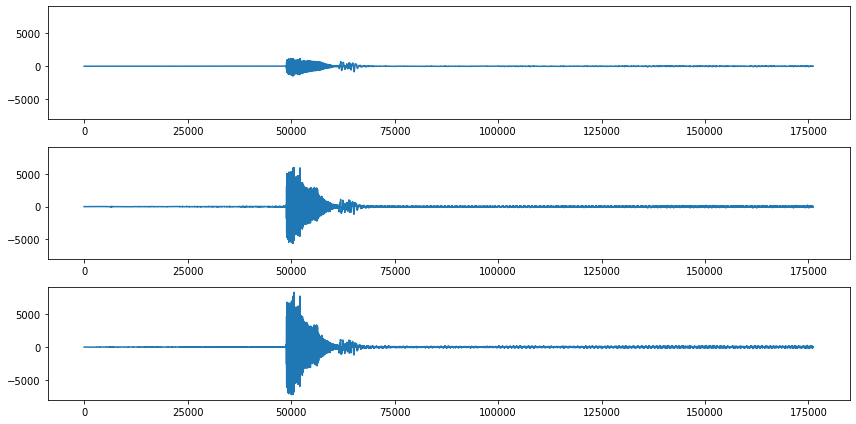

In [16]:
multiplot([lp1.samples, lp2.samples, lp3.samples])

Now we have some building blocks to try to create reverb algorithms. These filters can be combined in any number of ways with wildly different effects based on the topology and filter parameters.

First, I will try a "Schroeder Reverb" topology which is based on the work of Manfred Schroeder in the 1960s. This consists of "4 or more parallel comb filters (delay lines with feedback) of unequal length, with the outputs summed and run through two or more allpass delays" (see Valhalla article in sources). I use multiples of prime numbers for the delay times so that they will not overlap often which creates a more natural sound.

This took a lot of experimentation and tweaking. The structure is inspired by things I saw on the internet but a lot of it was just trying things out.

In [17]:
# Schroeder style reverb
# p = time parameter (0 to inf)
# dw = dry/wet (0 = dry to 1 = wet)
def schroeder(input, p, dw=1):
    # the internal parameters of the reverb were adjusted by hand
    # to create something that sounds approximately okay
    t = 20
    srate = input.srate
    primes = np.array([499, 503, 509, 521, 523, 541, 547, 557, 563, 569, 571, 577, 587, 593, 599, 601])
    ts = primes / 500
    
    # the gain of the feedback in the filters is controlled by the input parameter
    # more gain gives a longer decay time.
    # the gain must be strictly less than one to keep the signal
    # finite/decaying rather than growing.
    # the decay is exponential, so this exponential function allows the user
    # to input a decay parameter more naturally.
    # (I figured this out by playing around on desmos.com to find the right functional form.)
    g = 1-np.exp(-3*p)

    d1 = mstosamples(t*ts[0], srate)
    d2 = mstosamples(t*ts[1], srate)
    d3 = mstosamples(t*ts[2], srate)
    d4 = mstosamples(t*ts[3], srate)
    d5 = mstosamples(t*ts[4], srate)
    d6 = mstosamples(t*ts[5], srate)

    comb1 = combback(input, d1, g)
    comb2 = combback(input, d2, g)
    comb3 = combback(input, d3, g)
    comb4 = combback(input, d4, g)
    combsum = comb1 * 0.25 + comb2 * 0.25 + comb3 * 0.25 + comb4 * 0.25
    ap1 = allpass(combsum, d5, g)
    ap2 = allpass(ap1, d6, g)
    wet = ap2.astype(input.dt)
    
    output = (wet * dw + input * (1-dw)).astype(input.dt)
    return output

Time to test it out! I'll play back and plot the original signal first to hear and see a comparison. The reverb time and dry/wet can be controlled independently. Sometimes it is nice to have a long reverb but have its volume lower than the original signal, as shown in the last example below.

In [18]:
sch1 = schroeder(input, 0.7, 1)
sch2 = schroeder(input, 1, 1)
sch3 = schroeder(input, 1.3, 0.7)

input.display()
sch1.display()
sch2.display()
sch3.display()

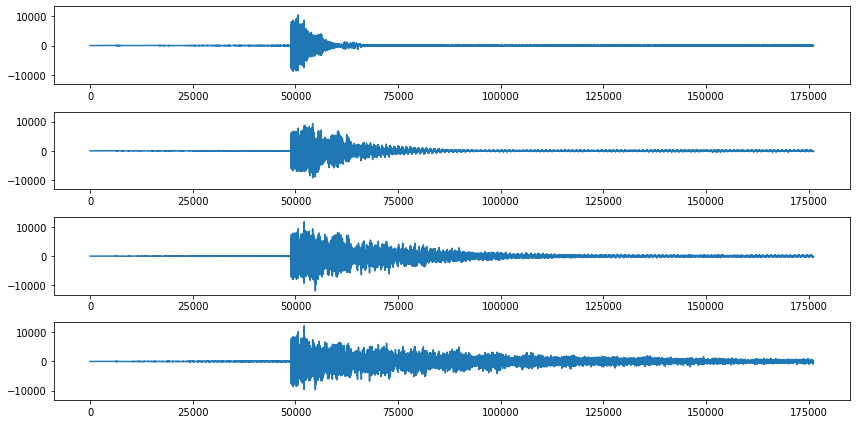

In [19]:
multiplot([input.samples, sch1.samples, sch2.samples, sch3.samples])

Now that I have all these filters, I might as well make up my own topology.

In [20]:
# Oliver's foobar reverb
def foobar(input):
    
    # filter out some lows on way in
    hp = highpass(input, 400)
    
    d1 = mstosamples(7, input.srate)
    d2 = mstosamples(29, input.srate)
    d3 = mstosamples(41, input.srate)
    d4 = mstosamples(71, input.srate)
    
    # run allpass filters in series
    ap1 = allpass(hp, d1, 0.5)
    ap2 = allpass(ap1, d2, 0.6)
    ap3 = allpass(ap2, d3, 0.7)
    ap4 = allpass(ap3, d4, 0.8)
    
    # put this into parallel comb fitlers
    comb1 = combback(ap4, d1, 0.8)
    comb2 = combback(ap4, d2, 0.8)
    
    combsum = comb1 * 0.5 + comb2 * 0.5
    
    # filter out some highs on way out
    lp = lowpass(combsum, 7000)
    
    output = lp.astype(input.dt)
    
    return output

In [21]:
foo = foobar(input)

input.display()
foo.display()

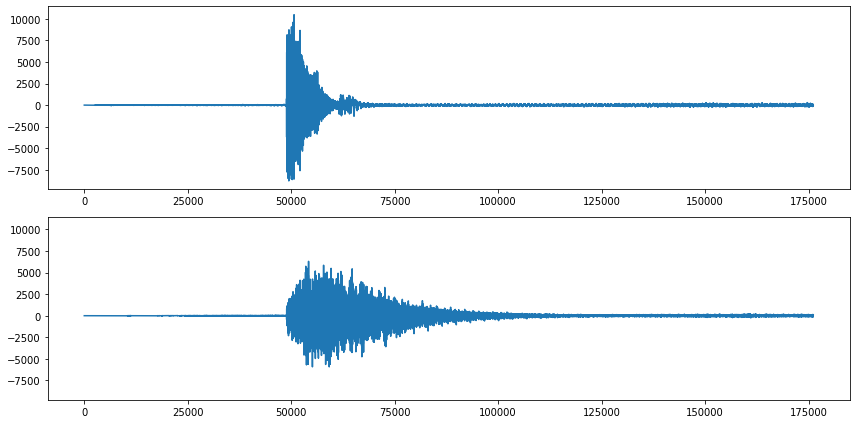

In [22]:
multiplot([input.samples, foo.samples])

As stated above, a fantastic sound was not the goal of this project.

After writing the algorithms and listening to how they sound on actual audio, I want to calculate the impulse responses of the reverbs. An impulse response is, well, the response (output) of the reverb when an impulse (short delta function spike) is sent through. The impulse response of a reverb or some system in general is useful for characterizing the system. Some systems—linear time invariant ones—are completely characterized by their impulse response. Impulse responses of reverberations are also useful in convolution reverb, another way of generating reverb.

To create an impulse, I have an array which starts with the maximum value that the array data type can take followed by many zeros. Its graph looks like a sharp spike. The impulse is run through the reverb and the output is shown on a graph.

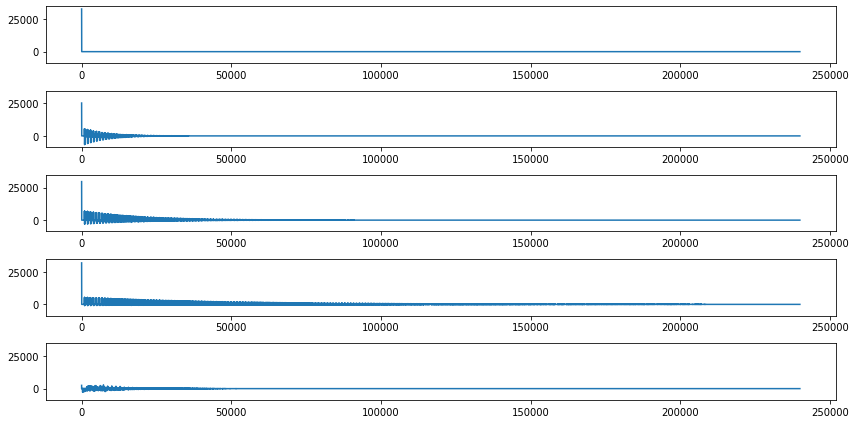

In [23]:
# make the impulse
peak = np.iinfo('int16').max # int16 is the data type I have been working with
srate=48000
t = 5 # 5 seconds
mylist = add(np.array([peak]), np.zeros(t*srate)).astype('int16')
impulse = Audio(mylist,srate)

# run it through some reverb
schres1 = schroeder(impulse, 0.7, 1)
schres2 = schroeder(impulse, 1, 1)
schres3 = schroeder(impulse, 1.3, 0.7)
foores = foobar(impulse)

# plot the responses
multiplot([impulse.samples, schres1.samples, schres2.samples, schres3.samples, foores.samples])

Lastly, I want to export .wav files of all the audio I generated in case the in-notebook player doesn't work or I want to use them elsewhere.

In [24]:
cf1.write('cf1.wav')
cf2.write('cf2.wav')
cf3.write('cf3.wav')

cb1.write('cb1.wav')
cb2.write('cb2.wav')
cb3.write('cb3.wav')

ap1.write('ap1.wav')
ap2.write('ap2.wav')
ap3.write('ap3.wav')

lp1.write('lp1.wav')
lp2.write('lp2.wav')
lp3.write('lp3.wav')

hp1.write('hp1.wav')
hp2.write('hp2.wav')
hp3.write('hp3.wav')

sch1.write('sch1.wav')
sch2.write('sch2.wav')
sch3.write('sch3.wav')

foo.write('foo.wav')

schres1.write('schres1.wav')
schres2.write('schres2.wav')
schres3.write('schres3.wav')

foores.write('foores.wav')

## Sources / References / Inspiration ##

https://medium.com/the-seekers-project/coding-a-basic-reverb-algorithm-part-2-an-introduction-to-audio-programming-4db79dd4e325

https://www.dsprelated.com/freebooks/pasp/Schroeder_Reverberators.html

https://ccrma.stanford.edu/~jos/Reverb/A_Schroeder_Reverberator_called.html

https://valhalladsp.com/2009/05/30/schroeder-reverbs-the-forgotten-algorithm/

https://en.wikipedia.org/wiki/Low-pass_filter

https://en.wikipedia.org/wiki/High-pass_filter

https://ccrma.stanford.edu/~jos/pasp/Difference_Equations_Finite_Difference.html

https://lpsa.swarthmore.edu/Representations/SysRepTransformations/TF2SDE.html